# Imports

In [1]:
import gc
from operator import concat
import kagglehub
import kagglehub.config
import json
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pytorch_lightning as pl
import torch
import torch.nn as nn
import torchmetrics

import wandb
import pytorch_lightning.loggers as wandb_logger

from RoadDataLoader import RoadDataLoader

from baseline_models.DeepLabV3Model import DeepLabV3Model
from baseline_models.UNET2D import UNET2D
from Swin_UNET.swin_transformer_unet_skip_expand_decoder_sys import SwinTransformerSys


from wrapper_modules.RoadSegmentationModule import RoadSegmentationModule

from loss_and_eval_functions import dice_score, combined_loss, iou_score

/home/ad.adasworks.com/bence.panczel/miniconda3/envs/melytanulas_hf/lib/python3.10/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


# Download

In [2]:
# get kaggle credentials file from ./kaggle.json
with open("./kaggle.json", "r") as f:
    kaggle_json = json.load(f)
kaggel_username = kaggle_json["username"]
kaggel_key = kaggle_json["key"]

In [3]:
kagglehub.config.set_kaggle_credentials(kaggel_username, kaggel_key)

Kaggle credentials set.


In [4]:
# Download latest version
path = kagglehub.dataset_download("payne18/road-detection-dataset-with-masks")
# make data folder if it does not exist
if not os.path.exists("./data"):
    os.mkdir("./data")
# Move data folder to ./data
os.system(f"mv {path} ./data/road-detection-dataset-with-masks")
# remove empty folder
folder_to_remove = path.split("payne18/road-detection-dataset-with-masks")[0] 
os.system((f"rm -r {folder_to_remove}"))

100%|██████████| 3.81G/3.81G [02:31<00:00, 27.0MB/s]

Extracting files...


0

# Load Data

In [2]:
data_path = "./data/road-detection-dataset-with-masks/deepglobe-road-extraction-dataset"
metadata_path = "./data/road-detection-dataset-with-masks/deepglobe-road-extraction-dataset/metadata.csv"

In [3]:
# open metadata
metadata = pd.read_csv(metadata_path)
print(f"All data: {metadata.shape[0]}")

All data: 8570


In [4]:
metadata = metadata[metadata["split"] == "train"]
print(f"Data without validation and test: {metadata.shape[0]}")
metadata["sat_image_path"] = metadata["sat_image_path"].apply(lambda x: os.path.join(data_path, x))
metadata["mask_path"] = metadata["mask_path"].apply(lambda x: os.path.join(data_path, x))
metadata.head()

Data without validation and test: 6226


,image_id,split,sat_image_path,mask_path
0,100034,train,./data/road-detection-dataset-with-masks/deepg...,./data/road-detection-dataset-with-masks/deepg...
1,100081,train,./data/road-detection-dataset-with-masks/deepg...,./data/road-detection-dataset-with-masks/deepg...
2,100129,train,./data/road-detection-dataset-with-masks/deepg...,./data/road-detection-dataset-with-masks/deepg...
3,100703,train,./data/road-detection-dataset-with-masks/deepg...,./data/road-detection-dataset-with-masks/deepg...
4,100712,train,./data/road-detection-dataset-with-masks/deepg...,./data/road-detection-dataset-with-masks/deepg...


# Training

In [5]:
# hyperparameters
batch_size = 8
optimizer = "Adam"
lr = 1e-3
weight_decay = 0.01
epochs = 40
loss_fn = combined_loss
accelerator = "auto"
pretrained = False
image_size = 512
num_workers = 8

In [6]:
dataLoader = RoadDataLoader(metadata, batch_size=batch_size, image_size=image_size, num_workers=num_workers)
# dataLoader.setup()
dataLoader.train_data = pd.read_csv("./metadata/traindata.csv", index_col=0)
dataLoader.val_data = pd.read_csv("./metadata/valdata.csv", index_col=0)
dataLoader.test_data = pd.read_csv("./metadata/testdata.csv", index_col=0)
dataLoader.train_data.head()

,image_id,split,sat_image_path,mask_path
2988,524867,train,./data/road-detection-dataset-with-masks/deepg...,./data/road-detection-dataset-with-masks/deepg...
72,110680,train,./data/road-detection-dataset-with-masks/deepg...,./data/road-detection-dataset-with-masks/deepg...
5370,869652,train,./data/road-detection-dataset-with-masks/deepg...,./data/road-detection-dataset-with-masks/deepg...
4394,73033,train,./data/road-detection-dataset-with-masks/deepg...,./data/road-detection-dataset-with-masks/deepg...
2152,40682,train,./data/road-detection-dataset-with-masks/deepg...,./data/road-detection-dataset-with-masks/deepg...


In [7]:
train_data_loader = dataLoader.train_dataloader()
val_data_loader = dataLoader.val_dataloader()

In [8]:
# save dataLoader.traindata, dataLoader.valdata and dataLoader.testdata to csv
# dataLoader.train_data.to_csv("./metadata/traindata.csv")
# dataLoader.val_data.to_csv("./metadata/valdata.csv")
# dataLoader.test_data.to_csv("./metadata/testdata.csv")

# Training with Swin_Unet

In [114]:
# hyperparameters


In [115]:
swin_model = SwinTransformerSys(
    img_size=image_size,           # Input méret
    patch_size=4,           # Patch méret
    in_chans=3,             # RGB képek
    num_classes=1,          # Bináris szegmentáció
    embed_dim=8,
    num_heads = (1, 2, 4, 8),
    depths = (2, 2, 6, 2),
    window_size=8,          # Ablak méret
    mlp_ratio=4.0,          # MLP arány
    qkv_bias=True,          # QKV bias
    drop_rate=0.1,          # Dropout ráta
    attn_drop_rate=0.1,     # Attention dropout
    drop_path_rate=0.1,     # Drop path
    norm_layer=nn.LayerNorm,# Rétegnormálás
    ape=False,              # Absolute positional embedding
    patch_norm=True,        # Patch normálás
    use_checkpoint=False    # Checkpoint
)

SwinTransformerSys expand initial----depths:(2, 2, 6, 2);depths_decoder:[1, 2, 2, 2];drop_path_rate:0.1;num_classes:1
---final upsample expand_first---


In [116]:
wandb.login()
module = RoadSegmentationModule(swin_model, loss_fn, optimizer)

In [117]:
#load model from checkpoint and continue training
# module.load_state_dict(torch.load("./models/Swin_UNET_best_model_small2.cpkt")["state_dict"])


/tmp/ipykernel_40408/804325610.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  module.load_state_dict(torch.load("./models/Swin_UNET_best_model_small2.cpkt")["state_dict

<All keys matched successfully>

In [118]:
log = wandb_logger.WandbLogger(project="road-segmentation", log_model="all", name="Swin_UNET")
checkpoint_callback = pl.callbacks.ModelCheckpoint(monitor="val_loss", mode="min")

trainer = pl.Trainer(
    max_epochs=epochs,
    accelerator="auto",
    logger=log,
    callbacks=[checkpoint_callback]
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


In [119]:
trainer.fit(module, train_data_loader, val_data_loader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name         | Type               | Params | Mode 
------------------------------------------------------------
0 | model        | SwinTransformerSys | 312 K  | train
1 | precision_fn | BinaryPrecision    | 0      | train
------------------------------------------------------------
312 K     Trainable params
0         Non-trainable params
312 K     Total params
1.250     Total estimated model params size (MB)
381       Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=40` reached.


In [120]:
wandb.finish()

epoch,▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇█████
train_dice_epoch,▂▂▂▁▃▂▂▃▂▃▄▄▄▃▄▄▄▅▅▅▆▅▅▆▅▅▆▆▆▆▇▇▇▆▇▆▇█▇█
train_dice_step,▅▅▅▆▄▇▇▅█▆▇▇▇▁▅▅▇▄▄▅▄▇▆▃▆▄█▅▇▆▅▆▄▇▆▆▇▆▆▆
train_iou_epoch,▂▂▂▁▃▂▂▃▂▃▄▄▄▃▄▄▄▅▅▅▆▅▅▆▅▅▆▆▆▆▇▇▇▆▇▆▇█▇█
train_iou_step,▄▅▆▅▄▆▆▅▂▃▅▃▂▅▂▄███▂▇▇▃▁▅▅▆▄▆▅▅▄▄▅▁▆▃▆█▅
train_loss_epoch,▇▇▇█▇▇▇▆▇▆▅▅▅▆▅▅▅▄▄▄▃▄▄▃▄▄▃▃▃▃▂▂▂▃▂▃▂▁▂▁
train_loss_step,▅▄▆▄▆▄▃▅▄█▃▃▅▄█▆█▆▂▃▇▅▂▁▄▃▆▅▃▄▂▃▆▃▅▄▃▃▅▁
train_precision_epoch,▂▂▂▁▃▂▂▃▂▂▄▄▄▃▄▄▄▅▅▅▆▅▅▆▅▅▆▇▆▆▇▇▇▇▇▆▇▇▇█
train_precision_step,▆▅▄██▅▅▇▆▆█▅▇▆▇▅▅▆▇█▇▆█▆▅▅▇▇▇▅▅▆█▆▆▃▇▇▁▇
trainer/global_step,▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂█▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆
val_dice_epoch,▂▁▃▃▂▄▄▃▂▅▅▁▅▆▃▅▆▄▆▄▆▅▃▇▅▅▆▆▅▆█▇▇▆▇▇▇▇▇▇


In [121]:
depplabv3_model_path = checkpoint_callback.best_model_path
print(depplabv3_model_path)
!cp {depplabv3_model_path} ./models//Swin_UNET.cpkt

./road-segmentation/2z5uy05h/checkpoints/epoch=30-step=17391.ckpt


# Testing models

In [8]:
# fun
def show_img_by_ids(ids, dataLoader, title, module, device):
    worst_images = []
    worse_masks = []
    worst_preds = []
    dataset = dataLoader.test_dataloader().dataset
    for idx in ids:
        image, mask = dataset.__getitem__(idx)
        image = image.unsqueeze(0)
        mask = mask.squeeze(0)
        image = image.to(device)
        mask = mask.to(device)
        pred = module(image)
        pred = torch.sigmoid(pred)
        pred = pred.squeeze(0)
        worst_images.append(image)
        worse_masks.append(mask)
        worst_preds.append(pred)
    
    fig, ax = plt.subplots(4, 3, figsize=(15, 25))
    fig.suptitle(title)
    for i in range(4):
        image = worst_images[i] * 0.5 + 0.5
        ax[i, 0].imshow(image.squeeze(0).permute(1, 2, 0).cpu())
        ax[i, 0].set_title("Input")
        ax[i, 0].axis("off")
        ax[i, 1].imshow(worse_masks[i].squeeze(0).cpu())
        ax[i, 1].set_title("Target")
        ax[i, 1].axis("off")
        ax[i, 2].imshow(torch.sigmoid(worst_preds[i]).squeeze(0).cpu().detach().numpy())
        ax[i, 2].set_title("Prediction")
        ax[i, 2].axis("off")
    plt.tight_layout()
    plt.show()

In [63]:
def show_img_by_ids_diff_models(id, dataLoader, title, modules, device, model_names):
    model_num = len(modules)
    worst_preds = []
    dataset = dataLoader.test_dataloader().dataset
    image, mask = dataset.__getitem__(id)
    image = image.unsqueeze(0)
    mask = mask.squeeze(0)
    image = image.to(device)
    mask = mask.to(device)
    for module in modules:
        pred = module(image)
        pred = torch.sigmoid(pred)
        pred = pred.squeeze(0)
        worst_preds.append(pred)

    image = image * 0.5 + 0.5
    image = image.squeeze(0).permute(1, 2, 0).cpu()
    mask = mask.squeeze(0).cpu()
    

    fig, ax = plt.subplots(model_num, 3, figsize=(15, model_num * 5))
    fig.suptitle(title)
    for i in range(model_num):
        
        ax[i, 0].imshow(image)
        ax[i, 0].set_title("Input")
        ax[i, 0].axis("off")
        ax[i, 1].imshow(mask)
        ax[i, 1].set_title("Target")
        ax[i, 1].axis("off")
        ax[i, 2].imshow(torch.sigmoid(worst_preds[i]).squeeze(0).cpu().detach().numpy())
        ax[i, 2].set_title(f"{model_names[i]} Prediction")
        ax[i, 2].axis("off")
    plt.tight_layout()
    plt.show()

In [9]:
def show_result(x, y, pred, title, sigmoid=True):
    if sigmoid:
        pred = torch.sigmoid(pred)
    fig, ax = plt.subplots(4, 3, figsize=(15, 25))
    fig.suptitle(title)
    for i in range(4):
        # denormalize x
        image = x[i] * 0.5 + 0.5
        ax[i, 0].imshow(image.permute(1, 2, 0))
        ax[i, 0].set_title("Input")
        ax[i, 0].axis("off")
        ax[i, 1].imshow(y[i].squeeze(0))
        ax[i, 1].set_title("Target")
        ax[i, 1].axis("off")
        ax[i, 2].imshow(pred[i].squeeze(0).detach().numpy())
        ax[i, 2].set_title("Prediction")
        ax[i, 2].axis("off")
    #tight layout
    plt.tight_layout()
    plt.show()

In [25]:
import time

def eval_model(model, dataLoader, device, model_name='model'):
    if dataLoader.batch_size > 1:
        raise ValueError("Batch size must be 1")
    eval_og = dataLoader.dataset.eval
    dataLoader.dataset.eval = True
    model.to(device)
    model.eval()
    
    precision = torchmetrics.Precision(task="binary").to(device)
    accuracy = torchmetrics.Accuracy(task='binary').to(device)
    
    total_IoU, total_dice, total_precision, total_accuracy, total_ABD = 0, 0, 0, 0, 0
    
    results = {'image_path':[], 'image_idx': [], 'IoU': [], 'Dice': [], 'Precision': [], 'Accuracy': []}
    
    number_of_images = len(dataLoader)
    
    inference_time = []
    with torch.no_grad():
        for x, y, path, index in dataLoader:
            x = x.to(device)
            y = y.to(device)
            
            start = time.time()
            pred = model(x)
            torch.cuda.synchronize()
            end = time.time()
            
            inference_time.append(end - start)
            
            IoU = iou_score(pred, y)
            Dice = dice_score(pred, y)
            Precision = precision(pred, y)
            Accuracy = accuracy(pred, y)
            
            total_IoU += IoU
            total_dice += Dice
            total_precision += Precision
            total_accuracy += Accuracy
            
            results['image_path'].append(path[0])
            results['image_idx'].append(index[0].item())
            results['IoU'].append(IoU.cpu().item())
            results['Dice'].append(Dice.cpu().item())
            results['Precision'].append(Precision.cpu().item())
            results['Accuracy'].append(Accuracy.cpu().item())
            
            
 
    avg_IoU = total_IoU / number_of_images
    avg_dice = total_dice / number_of_images
    avg_precision = total_precision / number_of_images
    avg_accuracy = total_accuracy / number_of_images
    avg_inference_time = sum(inference_time) / len(inference_time)
    
    print(f"{model_name} IoU: {avg_IoU}")
    print(f"{model_name} Dice: {avg_dice}")
    print(f"{model_name} Precision: {avg_precision}")
    print(f"{model_name} Accuracy: {avg_accuracy}")
    print(f"{model_name} Inference time: {avg_inference_time}")
    dataLoader.dataset.eval = eval_og
    return avg_IoU, avg_dice, avg_precision, avg_accuracy, avg_inference_time, pd.DataFrame(results)

In [11]:
metadata_path = "./data/road-detection-dataset-with-masks/deepglobe-road-extraction-dataset/metadata.csv"
# open metadata
metadata = pd.read_csv(metadata_path)
dataLoader = RoadDataLoader(metadata, batch_size=4, image_size=512, num_workers=8)
dataLoader.train_data = pd.read_csv("./metadata/traindata.csv", index_col=0)
dataLoader.val_data = pd.read_csv("./metadata/valdata.csv", index_col=0)
dataLoader.test_data = pd.read_csv("./metadata/testdata.csv", index_col=0)

In [12]:
test_dataLoader = dataLoader.test_dataloader()

for batch in test_dataLoader:
    x, y = batch
    break


In [13]:
deeplabv3_model_path = "./models/DeepLabV3_best_model.cpkt"
unet2d_model_path = "./models/UNET2D_best_model.cpkt"
swin_model_path = "./models/Swin_UNET.cpkt"

if not os.path.exists("./models"):
    os.mkdir("./models")
#check if file exists
if not os.path.exists(deeplabv3_model_path):
    !curl -L -o ./models/DeepLabV3_best_model.cpkt https://huggingface.co/beboi0122/Vision_transformers_for_image_segmentation_HF/resolve/main/DeepLabV3_best_model.cpkt
if not os.path.exists(unet2d_model_path):
    !curl -L -o ./models/UNET2D_best_model.cpkt https://huggingface.co/beboi0122/Vision_transformers_for_image_segmentation_HF/resolve/main/UNET2D_best_model.cpkt
if not os.path.exists(swin_model_path):
    !curl -L -o ./models/Swin_UNET.cpkt https://huggingface.co/beboi0122/Vision_transformers_for_image_segmentation_HF/resolve/main/Swin_UNET.cpkt


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  1110  100  1110    0     0   4867      0 --:--:-- --:--:-- --:--:--  4889
100 16.2M  100 16.2M    0     0  6936k      0  0:00:02  0:00:02 --:--:-- 7761k


In [14]:
optimizer = "Adam"
loss_fn = combined_loss

### Swin_UNET evaluation

In [15]:
swin_model = SwinTransformerSys(
    img_size=512,           # Input méret
    patch_size=4,           # Patch méret
    in_chans=3,             # RGB képek
    num_classes=1,          # Bináris szegmentáció
    embed_dim=8,
    num_heads = (1, 2, 4, 8),
    depths = (2, 2, 6, 2),
    window_size=8,          # Ablak méret
    mlp_ratio=4.0,          # MLP arány
    qkv_bias=True,          # QKV bias
    drop_rate=0.1,          # Dropout ráta
    attn_drop_rate=0.1,     # Attention dropout
    drop_path_rate=0.1,     # Drop path
    norm_layer=nn.LayerNorm,# Rétegnormálás
    ape=False,              # Absolute positional embedding
    patch_norm=True,        # Patch normálás
    use_checkpoint=False    # Checkpoint
)

SwinTransformerSys expand initial----depths:(2, 2, 6, 2);depths_decoder:[1, 2, 2, 2];drop_path_rate:0.1;num_classes:1
---final upsample expand_first---


/home/ad.adasworks.com/bence.panczel/miniconda3/envs/melytanulas_hf/lib/python3.10/site-packages/torch/functional.py:513: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3609.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [16]:
module = RoadSegmentationModule(swin_model, combined_loss, optimizer)
module.load_state_dict(torch.load(swin_model_path)["state_dict"])

/tmp/ipykernel_2248532/2791085785.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  module.load_state_dict(torch.load(swin_model_path)["state_dict"])


<All keys matched successfully>

In [17]:
device = "cuda" if torch.cuda.is_available() else "cpu"
module.to(device)
x = x.to(device)
y = y.to(device)

module.eval()
pred = module(x)

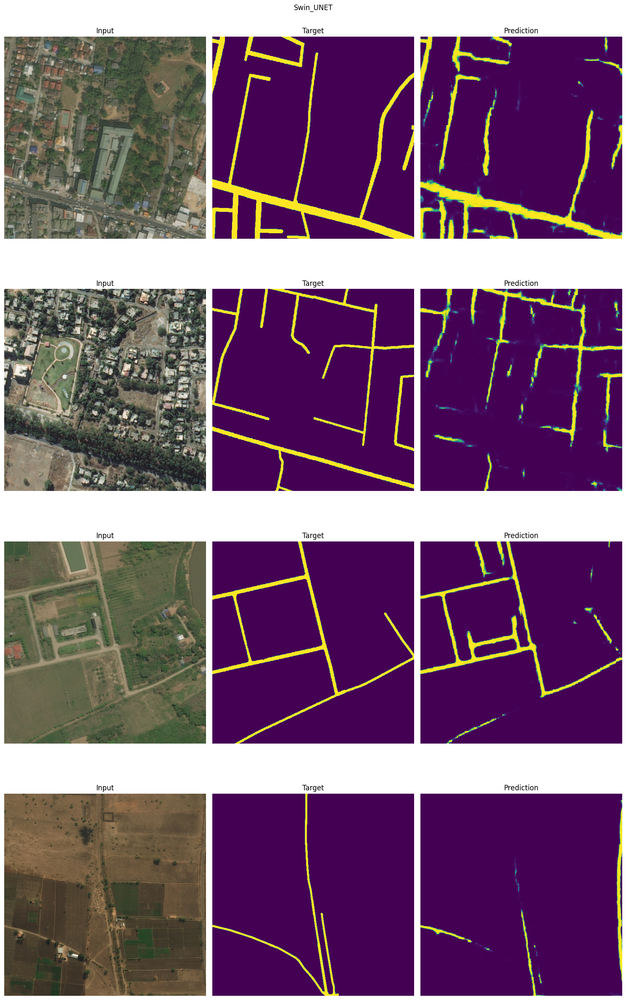

In [18]:
show_result(x.cpu(), y.cpu(), pred.cpu(), "Swin_UNET", sigmoid=True)

In [19]:
metadata_path = "./data/road-detection-dataset-with-masks/deepglobe-road-extraction-dataset/metadata.csv"
# open metadata
metadata = pd.read_csv(metadata_path)
dataLoader = RoadDataLoader(metadata, batch_size=1, image_size=512, num_workers=8)
dataLoader.train_data = pd.read_csv("./metadata/traindata.csv", index_col=0)
dataLoader.val_data = pd.read_csv("./metadata/valdata.csv", index_col=0)
dataLoader.test_data = pd.read_csv("./metadata/testdata.csv", index_col=0)

In [26]:
test_dataLoader = dataLoader.test_dataloader()
Swin_avg_IoU, Swin_avg_dice, Swin_avg_precision, Swin_avg_accuracy, Swin_avg_inference_time, Swin_resoults  = eval_model(module, test_dataLoader, device, "Swin_UNET")

Swin_UNET IoU: 0.3937198519706726
Swin_UNET Dice: 0.5439231991767883
Swin_UNET Precision: 0.5709629654884338
Swin_UNET Accuracy: 0.9660213589668274
Swin_UNET Inference time: 0.02584685139866718


In [27]:
Swin_resoults

,image_path,image_idx,IoU,Dice,Precision,Accuracy
0,./data/road-detection-dataset-with-masks/deepg...,0,0.568730,0.725083,0.749818,0.939098
1,./data/road-detection-dataset-with-masks/deepg...,1,0.430004,0.601403,0.671607,0.933613
2,./data/road-detection-dataset-with-masks/deepg...,2,0.507337,0.673157,0.650776,0.969906
3,./data/road-detection-dataset-with-masks/deepg...,3,0.405302,0.576819,0.858133,0.985382
4,./data/road-detection-dataset-with-masks/deepg...,4,0.429229,0.600644,0.539806,0.931683
...,...,...,...,...,...,...
493,./data/road-detection-dataset-with-masks/deepg...,493,0.548915,0.708774,0.583775,0.992191
494,./data/road-detection-dataset-with-masks/deepg...,494,0.207174,0.343238,0.292048,0.976021
495,./data/road-detection-dataset-with-masks/deepg...,495,0.481193,0.649737,0.693168,0.933800
496,./data/road-detection-dataset-with-masks/deepg...,496,0.017109,0.033642,0.055493,0.987904


In [28]:
worst_4 = Swin_resoults.sort_values(by="IoU").head(4)
worst_4_ids = worst_4["image_idx"].values
worst_4_ids

array([294,  40, 428, 313])

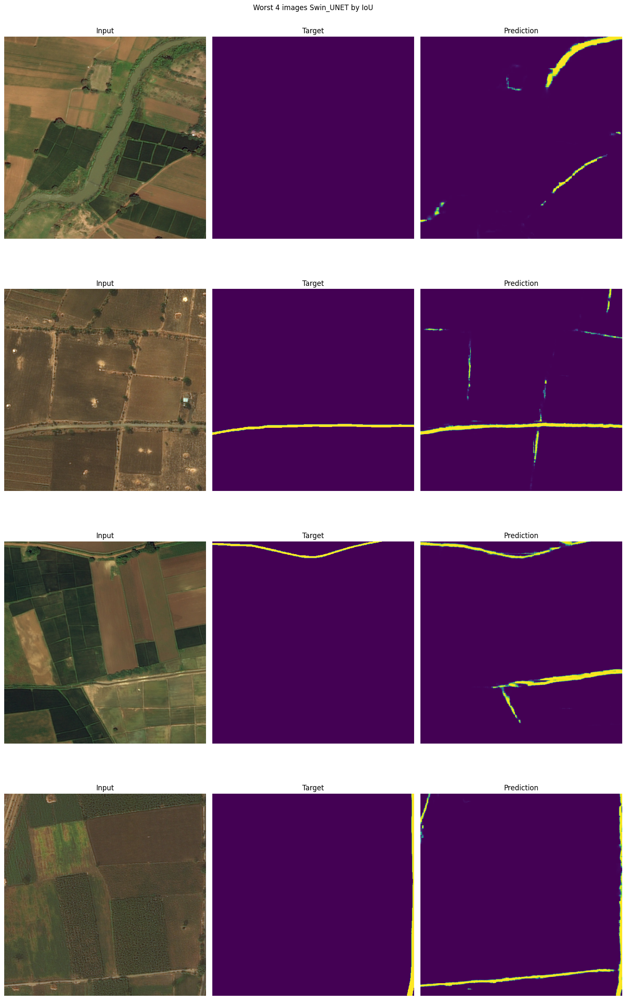

In [29]:
show_img_by_ids(worst_4_ids, dataLoader, "Worst 4 images Swin_UNET by IoU", module, device)
    

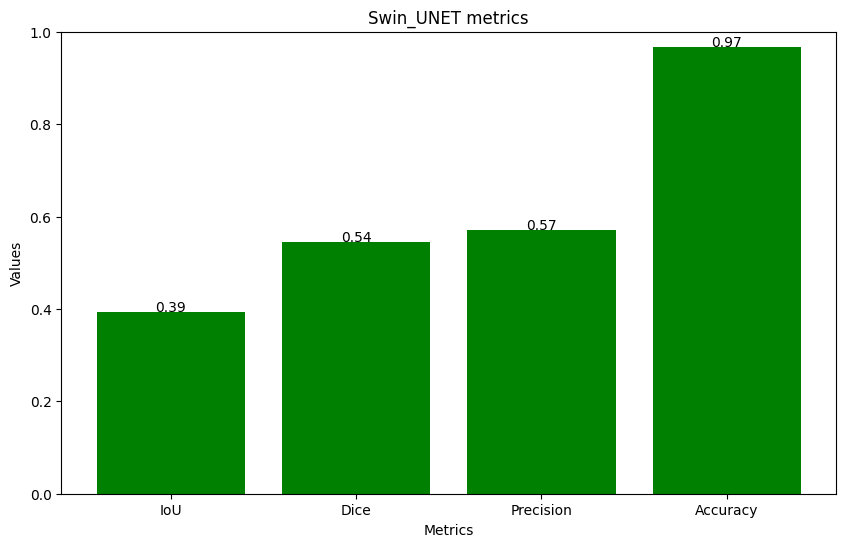

In [30]:
metrics = ['IoU', 'Dice', 'Precision', 'Accuracy']
values = [Swin_avg_IoU.cpu(), Swin_avg_dice.cpu(), Swin_avg_precision.cpu(), Swin_avg_accuracy.cpu()]

plt.figure(figsize=(10, 6))
plt.bar(metrics, values, color='green')

plt.title('Swin_UNET metrics')
plt.xlabel('Metrics')
plt.ylabel('Values')
plt.ylim(0, 1)

for i, v in enumerate(values):
    plt.text(i, v + 0.01, f'{v:.2f}', ha='center', va='center')
    
plt.show()

### Load Baseline models

In [33]:
deeplabv3_state_dict = torch.load(deeplabv3_model_path)["state_dict"]
deeplabv3_state_dict = {k.replace("model.model.", "model."): v for k, v in deeplabv3_state_dict.items()}
deeplabv3_model = DeepLabV3Model(pretrained=False)
deeplabv3_model.load_state_dict(deeplabv3_state_dict, strict=False)
deeplabv3_module = RoadSegmentationModule(deeplabv3_model, combined_loss, optimizer)

/tmp/ipykernel_2248532/3193918698.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  deeplabv3_state_dict = torch.load(deeplabv3_model_path)["state_dict"]
/home/ad.adaswork

In [34]:
metadata_path = "./data/road-detection-dataset-with-masks/deepglobe-road-extraction-dataset/metadata.csv"
# open metadata
metadata = pd.read_csv(metadata_path)
dataLoader = RoadDataLoader(metadata, batch_size=1, image_size=512, num_workers=8)
dataLoader.train_data = pd.read_csv("./metadata/traindata.csv", index_col=0)
dataLoader.val_data = pd.read_csv("./metadata/valdata.csv", index_col=0)
dataLoader.test_data = pd.read_csv("./metadata/testdata.csv", index_col=0)

In [35]:
test_dataLoader = dataLoader.test_dataloader()
DLV3_avg_IoU, DLV3_avg_dice, DLV3_avg_precision, DLV3_avg_accuracy, DLV3_avg_inference_time, DLV3_resoults = eval_model(deeplabv3_module, test_dataLoader, device, "DeepLabV3")

DeepLabV3 IoU: 0.47101834416389465
DeepLabV3 Dice: 0.6183681488037109
DeepLabV3 Precision: 0.6943646669387817
DeepLabV3 Accuracy: 0.9744965434074402
DeepLabV3 Inference time: 0.06042383234184909


In [36]:
unet2d_state_dict = torch.load(unet2d_model_path)["state_dict"]
unet2d_state_dict = {k.replace("model.", ""): v for k, v in unet2d_state_dict.items()}
unet2d_model = UNET2D(3, 1, chanel_list=[8, 16, 32, 64])
unet2d_model.load_state_dict(unet2d_state_dict, strict=False)
unet2d_module = RoadSegmentationModule(unet2d_model, loss_fn, optimizer)

/tmp/ipykernel_2248532/4130633912.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  unet2d_state_dict = torch.load(unet2d_model_path)["state_dict"]


In [37]:
metadata_path = "./data/road-detection-dataset-with-masks/deepglobe-road-extraction-dataset/metadata.csv"
# open metadata
metadata = pd.read_csv(metadata_path)
dataLoader = RoadDataLoader(metadata, batch_size=1, image_size=512, num_workers=8)
dataLoader.train_data = pd.read_csv("./metadata/traindata.csv", index_col=0)
dataLoader.val_data = pd.read_csv("./metadata/valdata.csv", index_col=0)
dataLoader.test_data = pd.read_csv("./metadata/testdata.csv", index_col=0)

In [38]:
test_dataLoader = dataLoader.test_dataloader()
UNET2D_avg_IoU, UNET2D_avg_dice, UNET2D_avg_precision, UNET2D_avg_accuracy, UNET2D_avg_inference_time, UNET2D_resoults = eval_model(unet2d_module, test_dataLoader, device, "UNET2D")

UNET2D IoU: 0.4514066278934479
UNET2D Dice: 0.6016438007354736
UNET2D Precision: 0.6745147109031677
UNET2D Accuracy: 0.9723273515701294
UNET2D Inference time: 0.006941140416156815


### Comparison

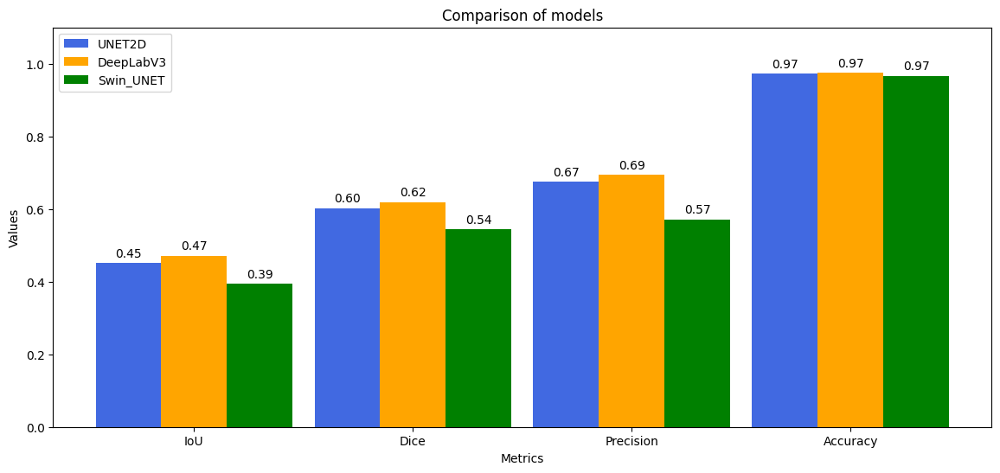

In [42]:
metrics = ['IoU', 'Dice', 'Precision', 'Accuracy']
u2_values = [UNET2D_avg_IoU.cpu(), UNET2D_avg_dice.cpu(), UNET2D_avg_precision.cpu(), UNET2D_avg_accuracy.cpu()]
d3_values = [DLV3_avg_IoU.cpu(), DLV3_avg_dice.cpu(), DLV3_avg_precision.cpu(), DLV3_avg_accuracy.cpu()]
su_values = [Swin_avg_IoU.cpu(), Swin_avg_dice.cpu(), Swin_avg_precision.cpu(), Swin_avg_accuracy.cpu()]

x = np.arange(len(metrics))
width = 0.3

fig, ax = plt.subplots(figsize=(14, 6))
bar1 = ax.bar(x - width, u2_values, width, label='UNET2D', color='royalblue')
bar2 = ax.bar(x, d3_values, width, label='DeepLabV3', color='orange')
bar3 = ax.bar(x + width, su_values, width, label='Swin_UNET', color='green')

ax.set_xlabel('Metrics')
ax.set_ylabel('Values')
ax.set_title('Comparison of models')
ax.set_ylim(0, 1.1)
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

def add_label(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.2f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 ponttal feljebb
                    textcoords="offset points",
                    ha='center', va='bottom')
        
add_label(bar1)
add_label(bar2)
add_label(bar3)


plt.show()

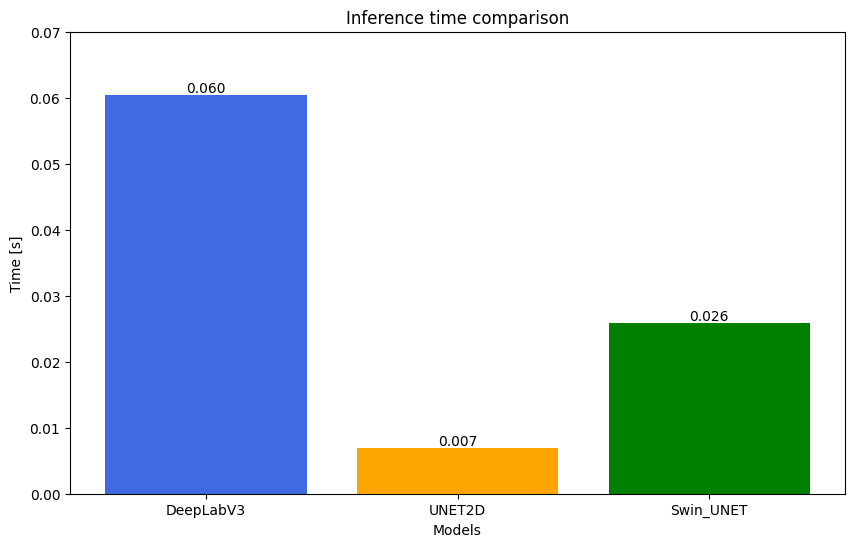

In [47]:
# compare inference time
inference_times = [DLV3_avg_inference_time, UNET2D_avg_inference_time, Swin_avg_inference_time]
models = ['DeepLabV3', 'UNET2D', 'Swin_UNET']

plt.figure(figsize=(10, 6))
plt.bar(models, inference_times, color=['royalblue', 'orange', 'green'])

plt.title('Inference time comparison')
plt.ylabel('Time [s]')
plt.xlabel('Models')
plt.ylim(0, 0.07)

for i, v in enumerate(inference_times):
    plt.text(i, v + 0.001, f'{v:.3f}', ha='center', va='center')


plt.show()

In [51]:
worst_of_swin_ids = Swin_resoults.sort_values(by="IoU").head(1)["image_idx"].values
worst_of_unet2d_ids = UNET2D_resoults.sort_values(by="IoU").head(1)["image_idx"].values
worst_of_deeplabv3_ids = DLV3_resoults.sort_values(by="IoU").head(1)["image_idx"].values

# Worst predictions

### Worst Swin_UNET prediction

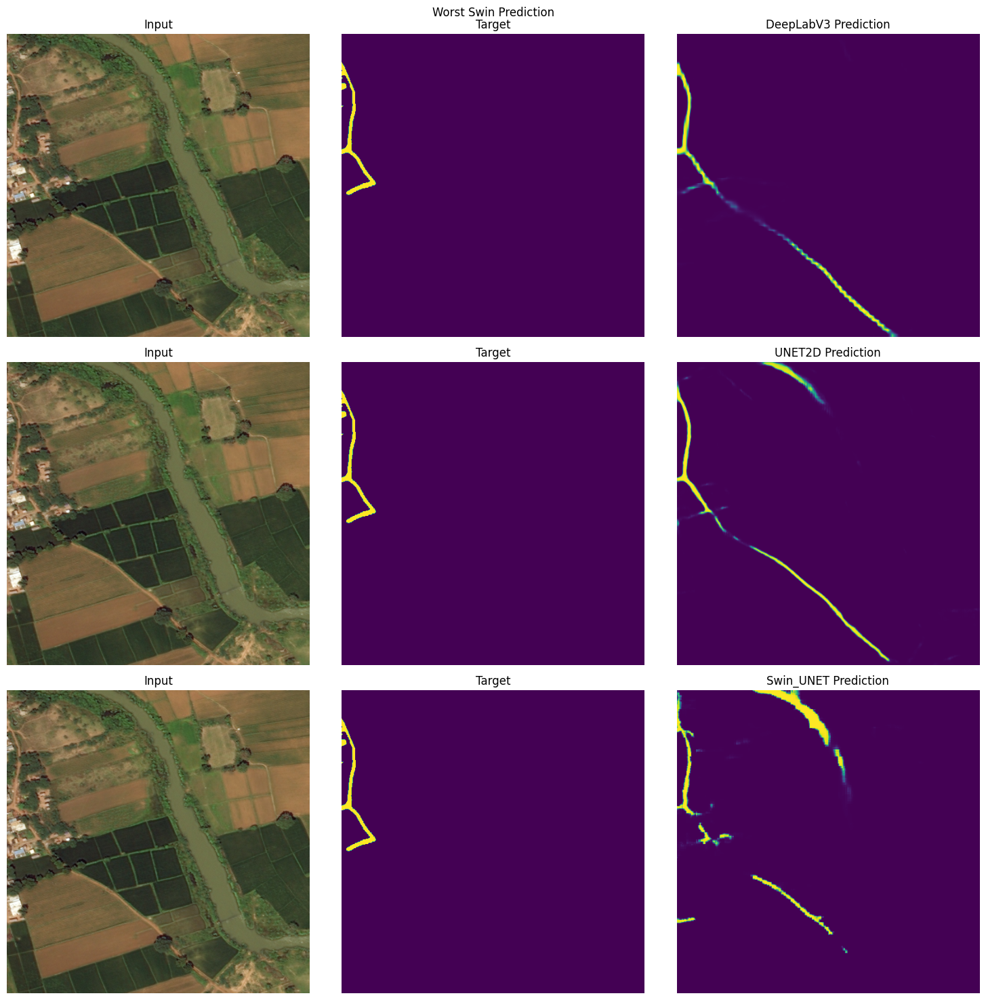

In [68]:
show_img_by_ids_diff_models(worst_of_swin_ids[0], dataLoader, "Worst Swin Prediction", [deeplabv3_module, unet2d_module, module], device, ["DeepLabV3", "UNET2D", "Swin_UNET"])

### Worst UNET2D prediction

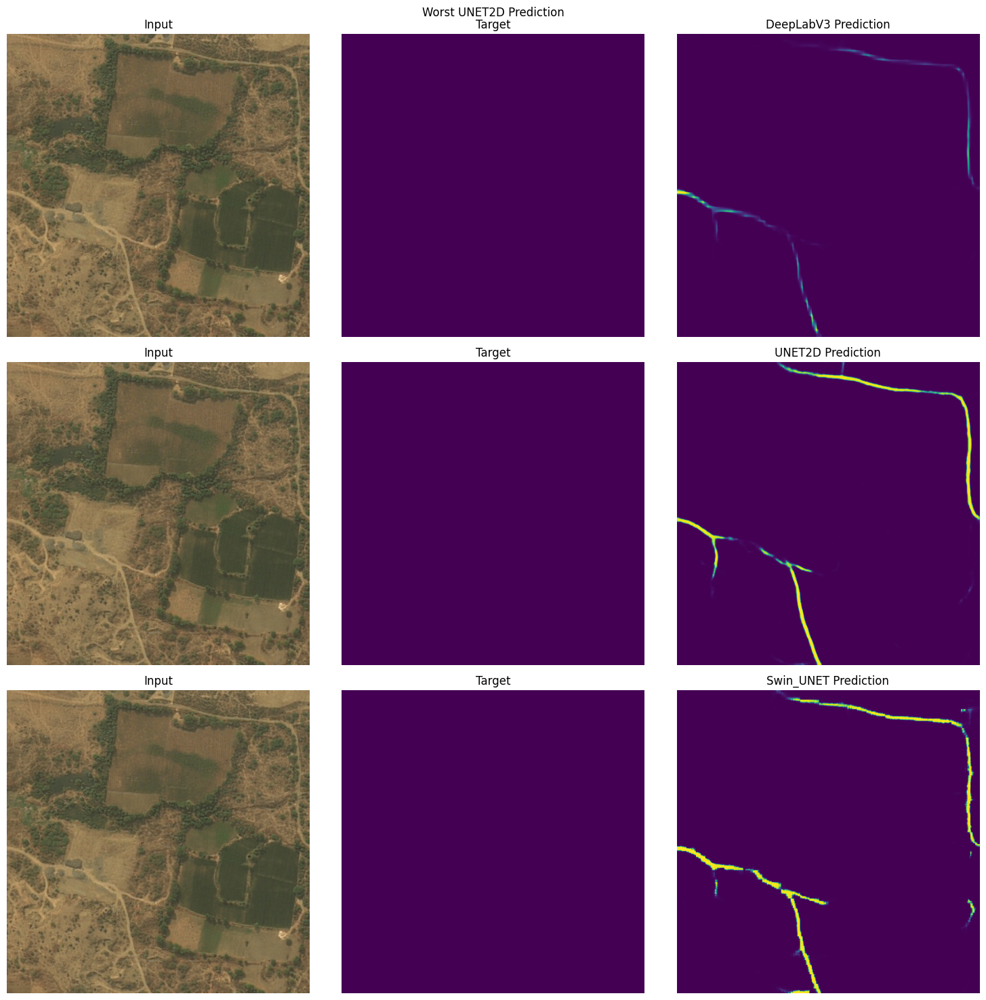

In [69]:
show_img_by_ids_diff_models(worst_of_unet2d_ids[0], dataLoader, "Worst UNET2D Prediction", [deeplabv3_module, unet2d_module, module], device, ["DeepLabV3", "UNET2D", "Swin_UNET"])

### Worst DeepLabV3 prediction

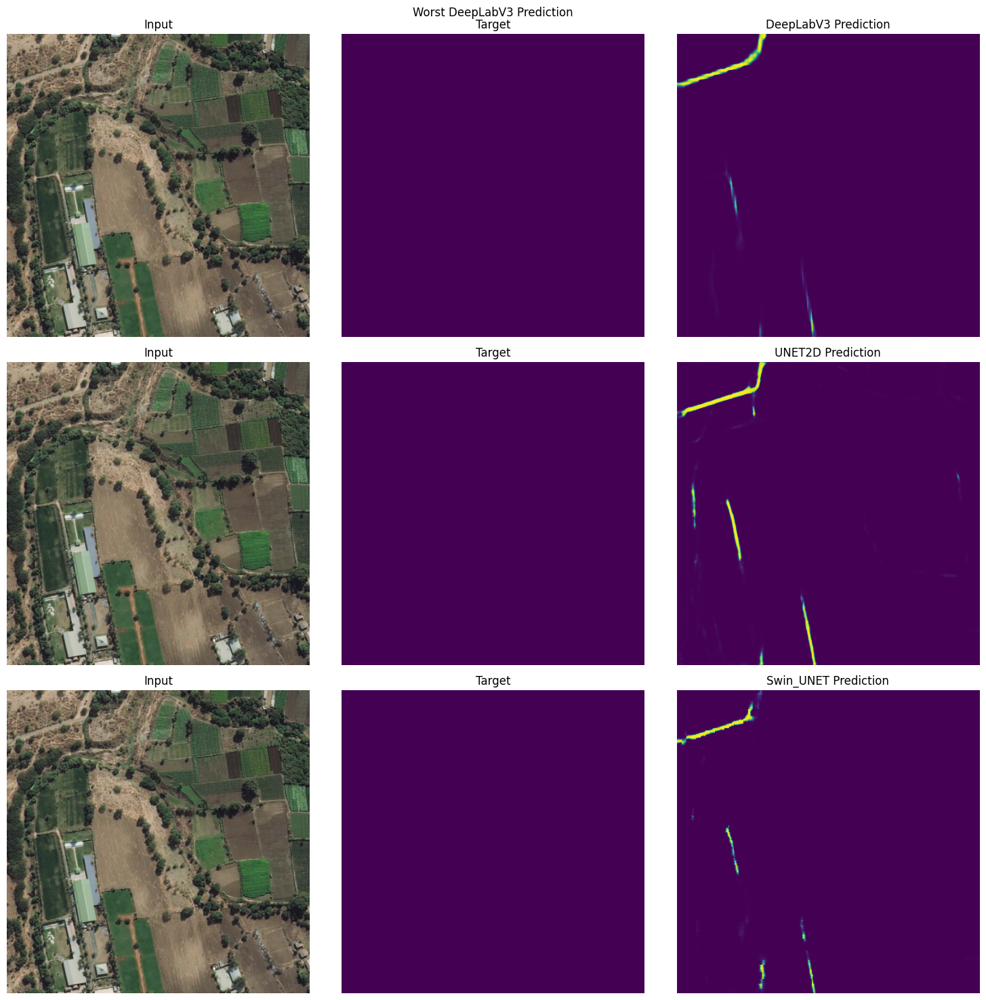

In [70]:
show_img_by_ids_diff_models(worst_of_deeplabv3_ids[0], dataLoader, "Worst DeepLabV3 Prediction", [deeplabv3_module, unet2d_module, module], device, ["DeepLabV3", "UNET2D", "Swin_UNET"])